# Задание №1 – Предварительный анализ данных и визуализация
Написать программу на Python, которая загружает набор данных по вашему варианту и производит исследовательский анализ этих данных и визуализирует ряд зависимостей между признаками в нижеперечисленных вариациях с помощью библиотек matplotlib, sns и plotly.
1. Получить описание набора данных и список атрибутов, получить число пропущенных значений в для каждого атрибута.
2. Обработать пропущенные значения (удалить строки/ удалить атрибуты/ выполнить импутацию значений)
3. Построить pairplot для набора данных
4. Выбрать не менее 2-х признаков с неким распределением значений, и отобразить это распределение с помощью гистограмм hist и kdeplot, jointplot
5. Выбрать часть признаков датасета и отобразить корреляцию между ними в виде тепловой карты (heatmap).
6. Выбрать 3 признака (имеющие некое распределение значений), целевую переменную (категориальную) и отобразить для них графики размаха (ящик с усами, box plot).
8. Визуализировать некоторые статистики, для разных атрибутов с использованием следующих инструментов: violinplot, stripplot, swarmplot, pie.
9. Выделить выбросы в данных с помощью следующих инструментов: межквартильный размах, фактор локального выброса, эллиптическая оболочка, одноклассовый SVM и изолированный лес.
Напишите короткое заключение о наиболее интересных зависимостях, которые Вы обнаружили в данных.

### Variant - White wine
датасет – Качество вина (https://archive.ics.uci.edu/ml/datasets/Wine+Quality) предсказываемое значение – качество (Quality), для датасета с белым вином, winequality-white.csv;

## Task 1 - Получить описание набора данных и список атрибутов, получить число пропущенных значений в для каждого атрибута.

In [65]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
df = pd.read_csv('../data/ml-lab1/winequality-white.csv', sep=';')

In [3]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [4]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


## Task 2 - Обработать пропущенные значения (удалить строки/ удалить атрибуты/ выполнить импутацию значений)

Пропущенных значений нет

## Task 3 - Построить pairplot для набора данных

In [12]:
df['quality'].sort_values().unique()

array([3, 4, 5, 6, 7, 8, 9], dtype=int64)

In [13]:
lq_df = df[df['quality'] < 7]
hq_df = df[df['quality'] >= 7]

In [16]:
(lq_df.count(), hq_df.count())

(fixed acidity           3838
 volatile acidity        3838
 citric acid             3838
 residual sugar          3838
 chlorides               3838
 free sulfur dioxide     3838
 total sulfur dioxide    3838
 density                 3838
 pH                      3838
 sulphates               3838
 alcohol                 3838
 quality                 3838
 dtype: int64,
 fixed acidity           1060
 volatile acidity        1060
 citric acid             1060
 residual sugar          1060
 chlorides               1060
 free sulfur dioxide     1060
 total sulfur dioxide    1060
 density                 1060
 pH                      1060
 sulphates               1060
 alcohol                 1060
 quality                 1060
 dtype: int64)

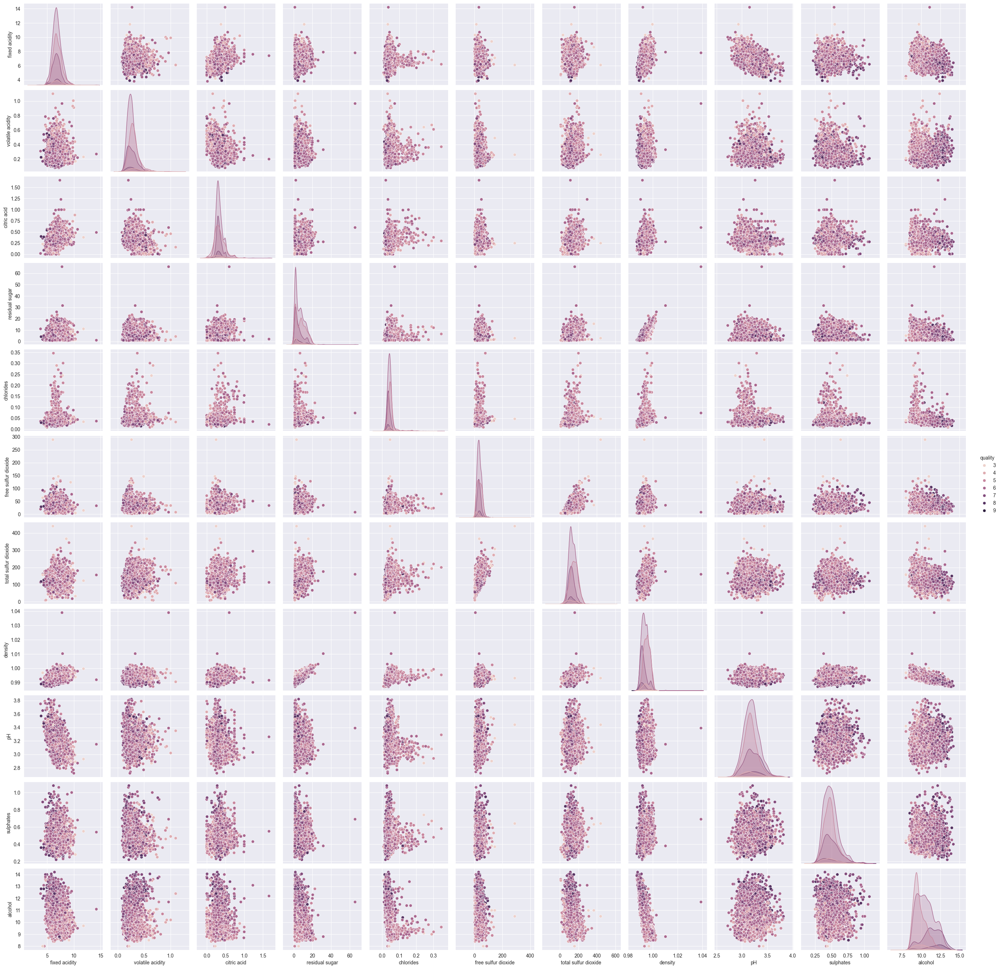

In [6]:
sns.pairplot(df, hue='quality')

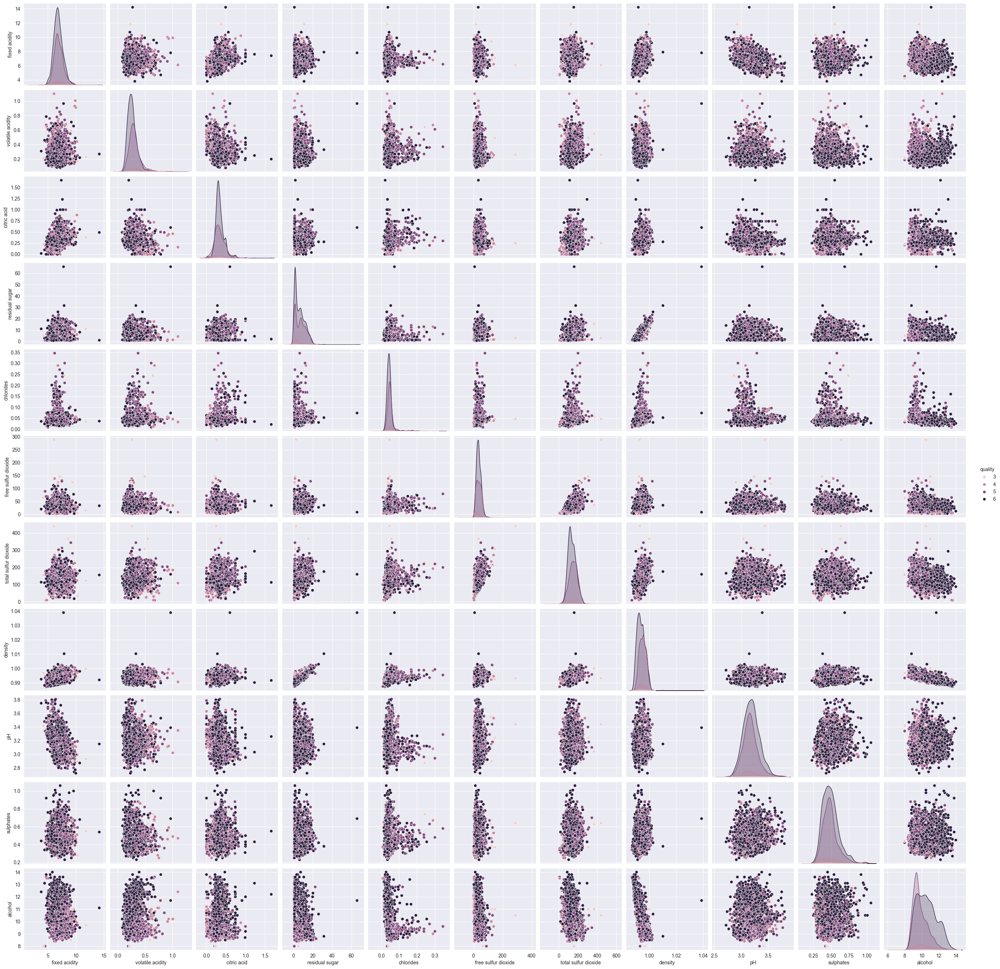

In [14]:
sns.pairplot(lq_df, hue='quality')

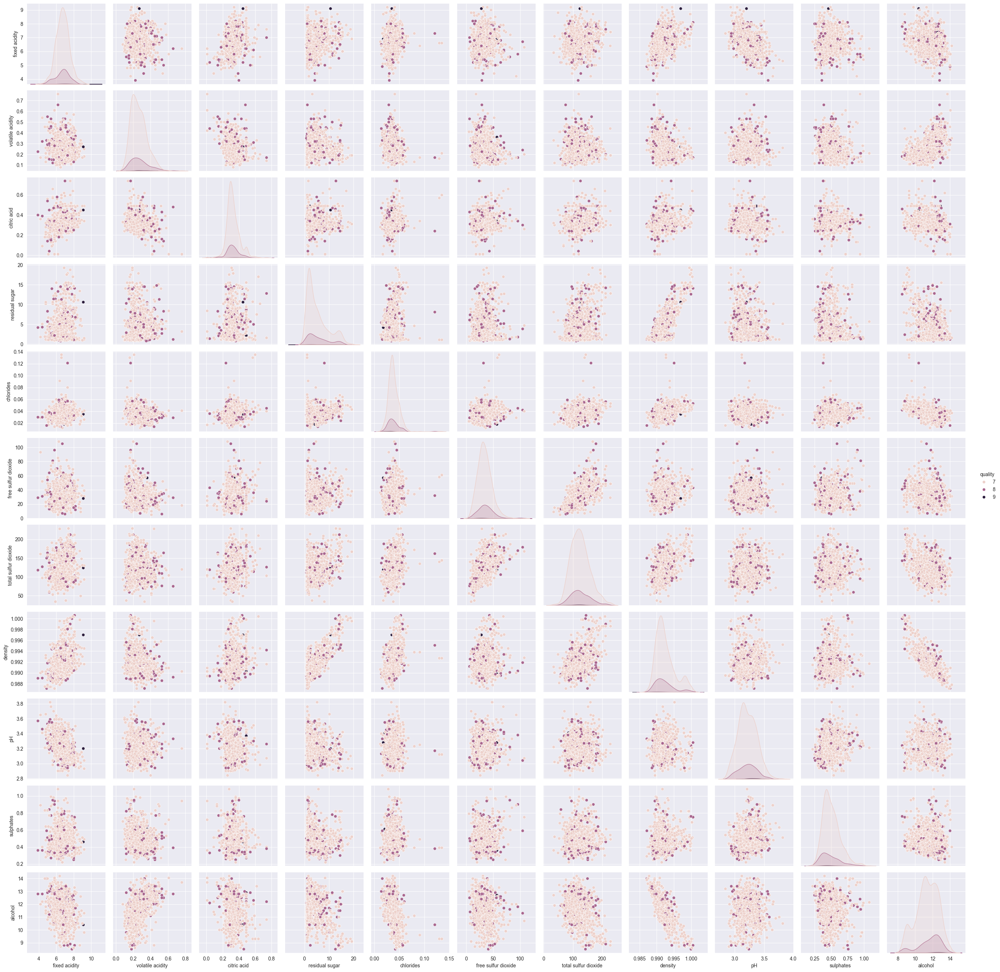

In [15]:
sns.pairplot(hq_df, hue='quality')

## Task 4 - Выбрать не менее 2-х признаков с неким распределением значений, и отобразить это распределение с помощью гистограмм hist и kdeplot, jointplot

In [18]:
t4_df = df[['alcohol', 'citric acid', 'pH', 'quality']]
t4_df.describe()

,alcohol,citric acid,pH,quality
count,4898.000000,4898.000000,4898.000000,4898.000000
mean,10.514267,0.334192,3.188267,5.877909
std,1.230621,0.121020,0.151001,0.885639
min,8.000000,0.000000,2.720000,3.000000
25%,9.500000,0.270000,3.090000,5.000000
50%,10.400000,0.320000,3.180000,6.000000
75%,11.400000,0.390000,3.280000,6.000000
max,14.200000,1.660000,3.820000,9.000000


<Axes: xlabel='quality', ylabel='Count'>

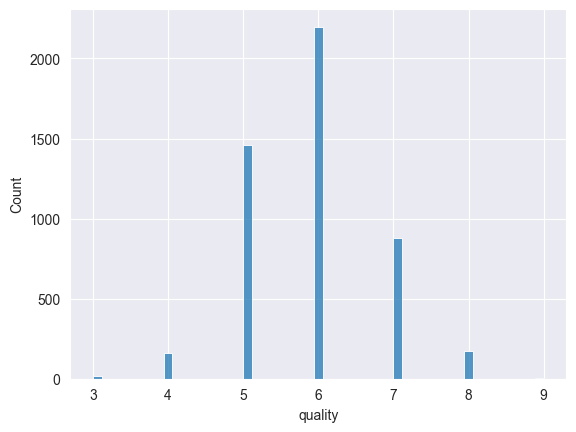

In [21]:
sns.histplot(t4_df['quality'])

Распределение по качеству имеет визуальные признаки нормальной формы

<Axes: xlabel='alcohol', ylabel='Count'>

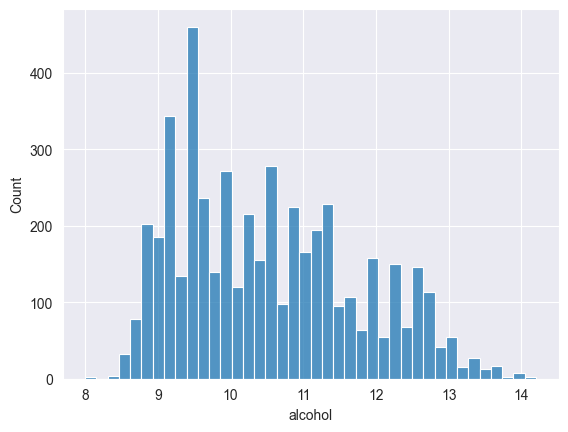

In [29]:
sns.histplot(t4_df['alcohol'], bins=40)

Значения алкоголя лежат в интервале 8–14 единиц. Частота значений плавно убывает за пределами этого диапазона. Визуально распределение похоже на нормальное с положительной асимметрией. Чаще встречаются значения от 9 до 11.5

<Axes: xlabel='citric acid', ylabel='Count'>

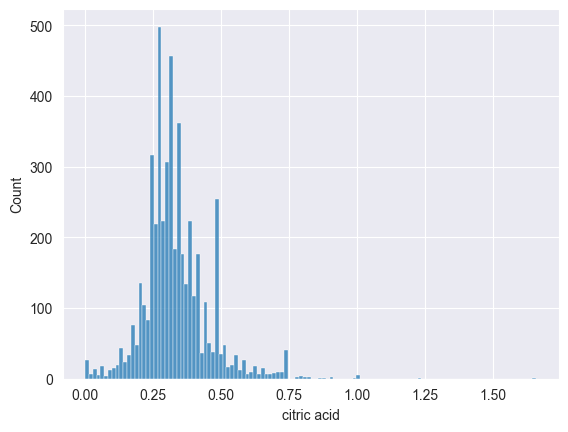

In [23]:
sns.histplot(t4_df['citric acid'])

Распределение имеет положительную асимметрию.

<Axes: xlabel='pH', ylabel='Count'>

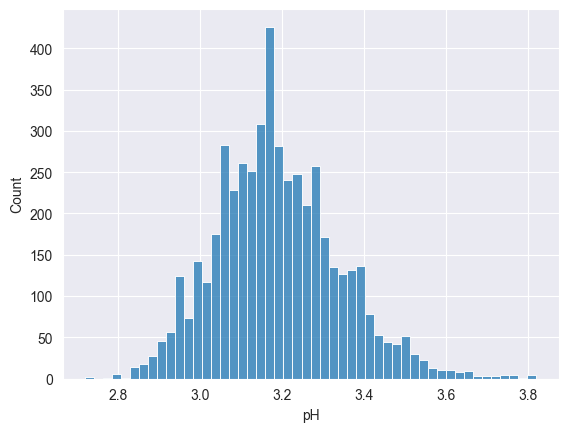

In [24]:
sns.histplot(t4_df['pH'])

Распределение визуально похоже на нормальное, с небольшой положительной асимметрией.

<Axes: xlabel='alcohol', ylabel='Density'>

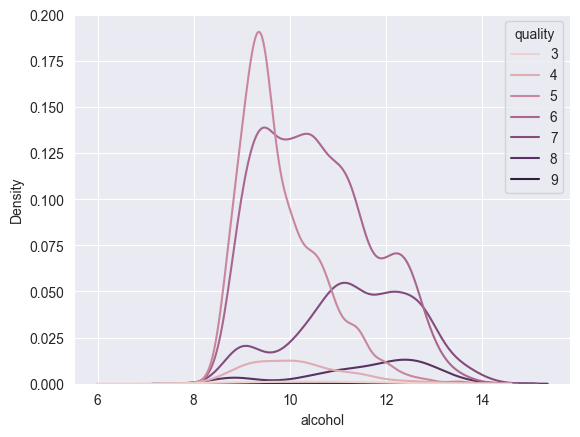

In [27]:
sns.kdeplot(t4_df, x='alcohol', hue='quality')

В целом диапазон алкоголя в винах различного качества подтверждает выводы сделанные по гистограмме

<Axes: xlabel='citric acid', ylabel='Density'>

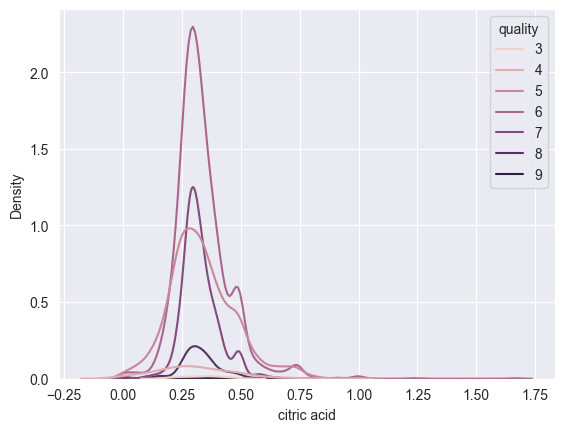

In [30]:
sns.kdeplot(t4_df, x='citric acid', hue='quality')

Различные качества имеют похожие пиковые значения.

<Axes: xlabel='pH', ylabel='Density'>

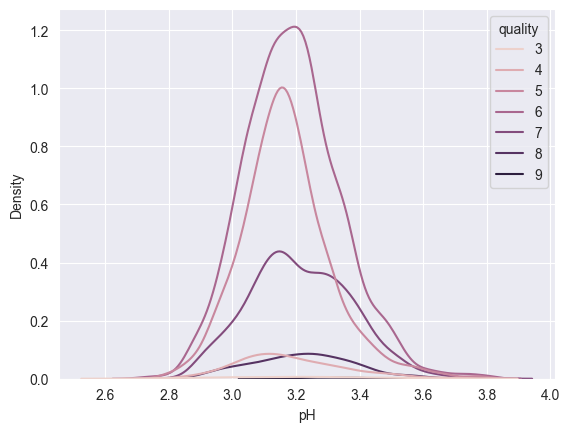

In [31]:
sns.kdeplot(t4_df, x='pH', hue='quality')

Различные качества имеют похожие пиковые значения.

In [34]:
t4_df['quality_groups'] = t4_df['quality'].apply(lambda x: 'low' if x < 7 else 'high')
t4_df

C:\Users\hjklv\AppData\Local\Temp\ipykernel_55640\565199938.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  t4_df['quality_groups'] = t4_df['quality'].apply(lambda x: 'low' if x < 7 else 'high')


,alcohol,citric acid,pH,quality,quality_groups
0,8.8,0.36,3.00,6,low
1,9.5,0.34,3.30,6,low
2,10.1,0.40,3.26,6,low
3,9.9,0.32,3.19,6,low
4,9.9,0.32,3.19,6,low
...,...,...,...,...,...
4893,11.2,0.29,3.27,6,low
4894,9.6,0.36,3.15,5,low
4895,9.4,0.19,2.99,6,low
4896,12.8,0.30,3.34,7,high


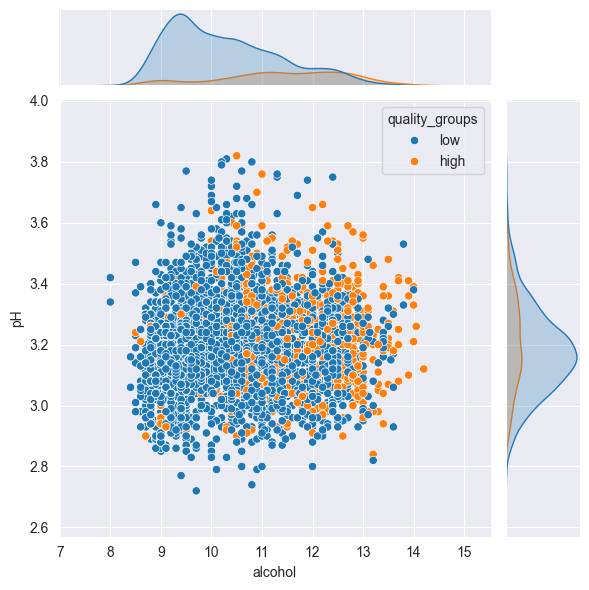

In [35]:
sns.jointplot(t4_df, x='alcohol', y='pH', hue='quality_groups')

По содержанию алкоголя более качественные вина имеют значения больше. По кислотности возможно нет различий.

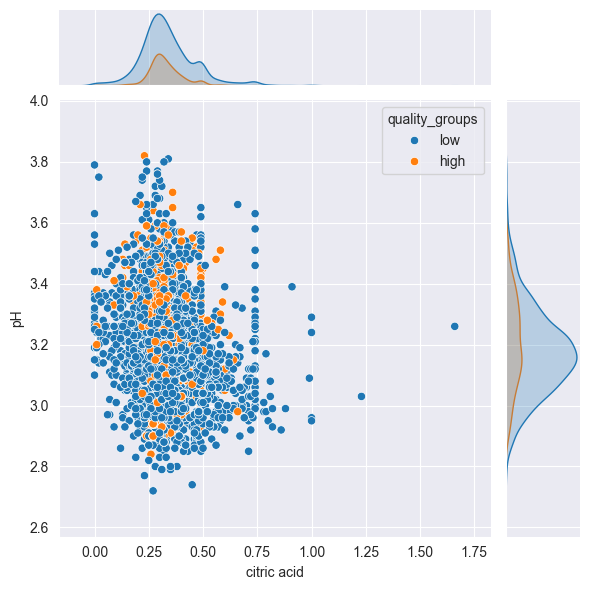

In [36]:
sns.jointplot(t4_df, x='citric acid', y='pH', hue='quality_groups')

По содержанию лимонной кислоты вина низкого качества имеют больший диапазон.

## Task 5 - Выбрать часть признаков датасета и отобразить корреляцию между ними в виде тепловой карты (heatmap).

In [38]:
t5_df = t4_df
t5_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   alcohol         4898 non-null   float64
 1   citric acid     4898 non-null   float64
 2   pH              4898 non-null   float64
 3   quality         4898 non-null   int64  
 4   quality_groups  4898 non-null   object 
dtypes: float64(3), int64(1), object(1)
memory usage: 191.5+ KB


<Axes: >

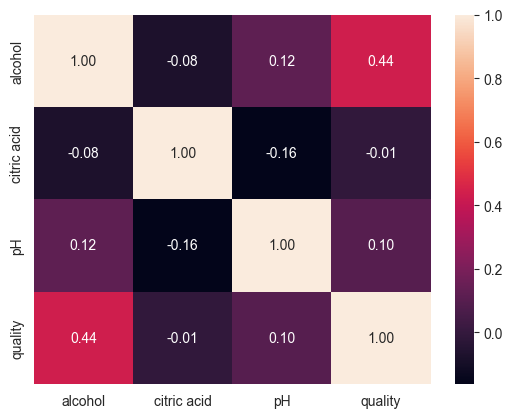

In [40]:
corr = t5_df[['alcohol', 'citric acid', 'pH', 'quality']].corr()
sns.heatmap(corr, annot=True, fmt='.2f')

Между алкоголем и качеством есть положительная корреляция средней силы. Это можно заметить на графике плотности. Распределение алкоголя имеет диапазон с пиком между 12 и 14 алкоголя, что выше диапазона пика всех вин находящегося между 9 и 10.

Связь между pH и лимонной кислотой отрицательная, что можно объяснить тем, что кислотность влияет на pH в отрицательную сторону. Связь слабая так как есть другие показатели, которые не были включены в матрицу.

## Task 6 - Выбрать 3 признака (имеющие некое распределение значений), целевую переменную (категориальную) и отобразить для них графики размаха (ящик с усами, box plot).

In [43]:
t6_df = t4_df[['alcohol', 'citric acid', 'pH', 'quality', 'quality_groups']]
t6_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   alcohol         4898 non-null   float64
 1   citric acid     4898 non-null   float64
 2   pH              4898 non-null   float64
 3   quality         4898 non-null   int64  
 4   quality_groups  4898 non-null   object 
dtypes: float64(3), int64(1), object(1)
memory usage: 191.5+ KB


<Axes: xlabel='alcohol', ylabel='quality_groups'>

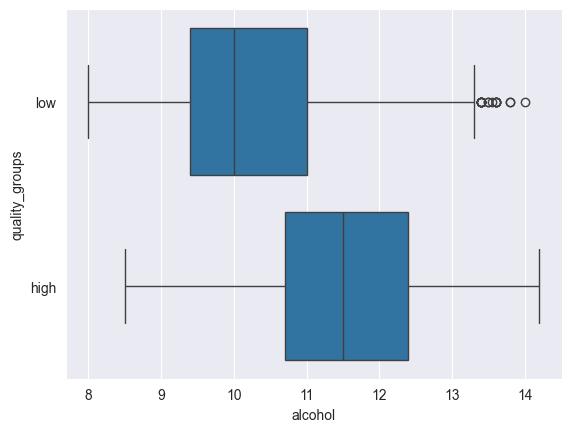

In [44]:
sns.boxplot(data=t6_df, x='alcohol', y='quality_groups')

График подтверждает выводы сделанные в предыдущих графиках. Вина низкого качества имеют больший диапозон по алкоголю, но большая часть находится около 10.

## Task 8 - Визуализировать некоторые статистики, для разных атрибутов с использованием следующих инструментов: violinplot, stripplot, swarmplot, pie.

In [52]:
t8_df = t4_df[['alcohol', 'citric acid', 'pH', 'quality', 'quality_groups']]
t8_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   alcohol         4898 non-null   float64
 1   citric acid     4898 non-null   float64
 2   pH              4898 non-null   float64
 3   quality         4898 non-null   int64  
 4   quality_groups  4898 non-null   object 
dtypes: float64(3), int64(1), object(1)
memory usage: 191.5+ KB


<Axes: xlabel='pH'>

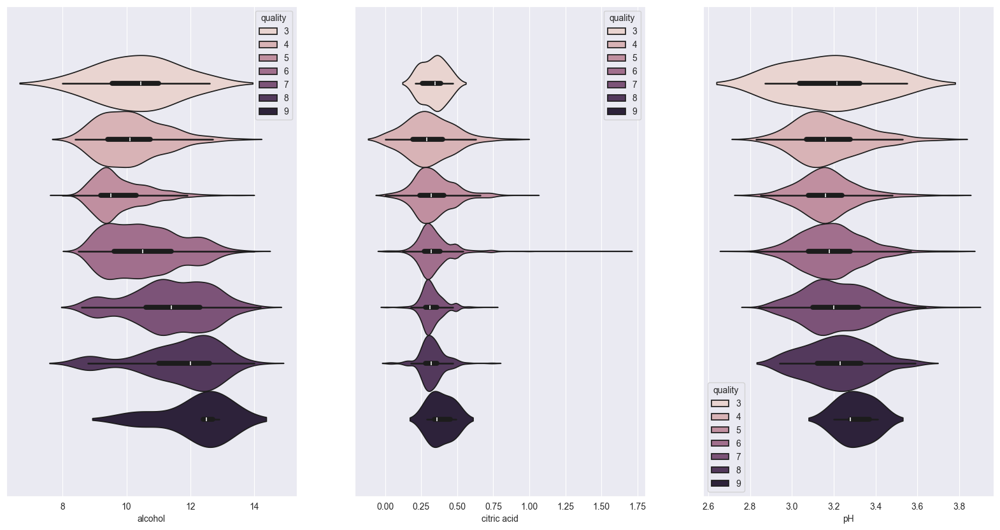

In [53]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))

sns.violinplot(data=t8_df, x='alcohol', hue='quality', ax=axes[0])
sns.violinplot(data=t8_df, x='citric acid', hue='quality', ax=axes[1])
sns.violinplot(data=t8_df, x='pH', hue='quality', ax=axes[2])

<Axes: xlabel='pH'>

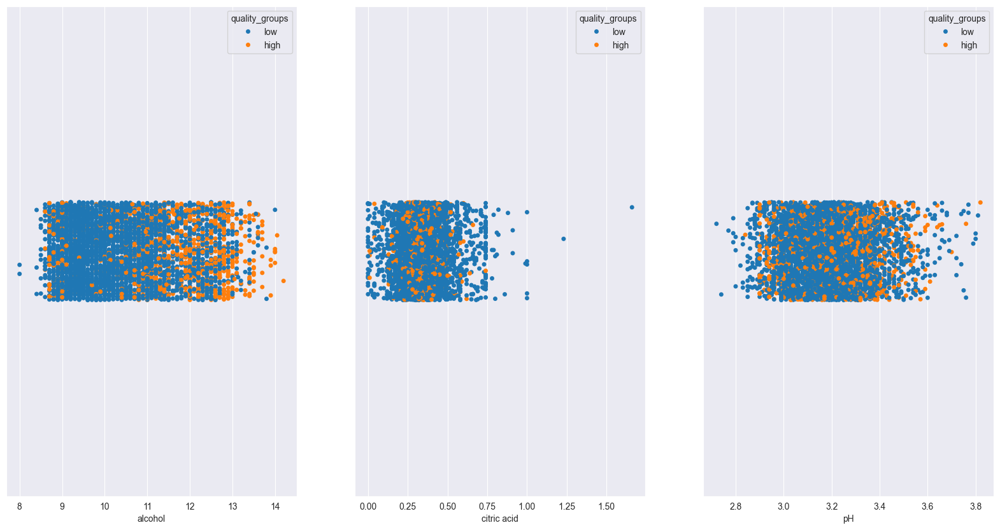

In [55]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))

sns.stripplot(data=t8_df, x='alcohol', hue='quality_groups', ax=axes[0])
sns.stripplot(data=t8_df, x='citric acid', hue='quality_groups', ax=axes[1])
sns.stripplot(data=t8_df, x='pH', hue='quality_groups', ax=axes[2])

In [61]:
hq_t8_df = t8_df[t8_df['quality'] >= 8]

<Axes: xlabel='pH'>

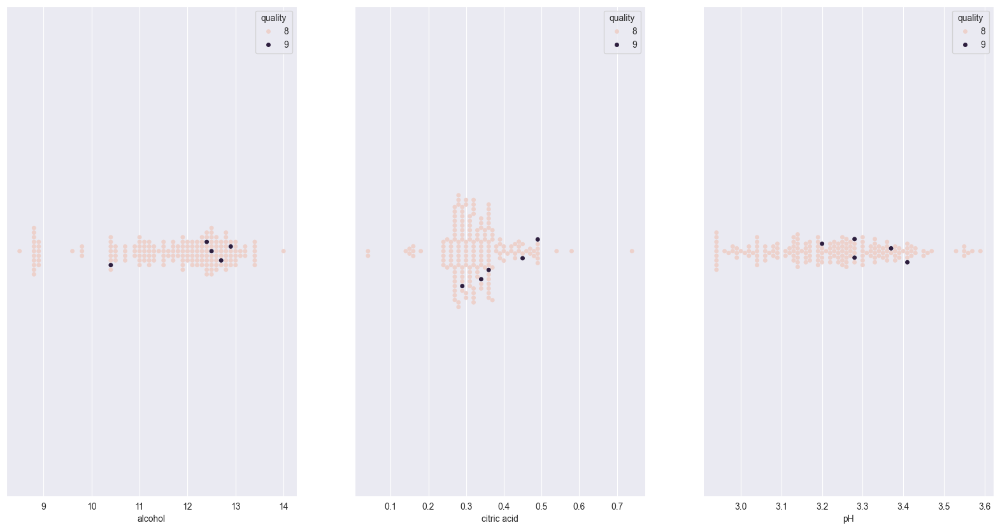

In [63]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))

sns.swarmplot(data=hq_t8_df, x='alcohol', hue='quality', ax=axes[0])
sns.swarmplot(data=hq_t8_df, x='citric acid', hue='quality', ax=axes[1])
sns.swarmplot(data=hq_t8_df, x='pH', hue='quality', ax=axes[2])

In [82]:
count_df = t8_df.groupby('quality').size().rename(columns=['quality', 'count'])
count_df

TypeError: Series.rename() got an unexpected keyword argument 'columns'

In [83]:
px.pie(count_df, values=count_df.values, names=count_df.index)

## Task 9 - Выделить выбросы в данных с помощью следующих инструментов: межквартильный размах, фактор локального выброса, эллиптическая оболочка, одноклассовый SVM и изолированный лес.

### Межквартильный размах (IQR)

In [86]:
t9_df = t8_df
lq_t9_df = t9_df[t9_df['quality_groups'] == 'low']
lq_t9_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3838 entries, 0 to 4897
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   alcohol         3838 non-null   float64
 1   citric acid     3838 non-null   float64
 2   pH              3838 non-null   float64
 3   quality         3838 non-null   int64  
 4   quality_groups  3838 non-null   object 
dtypes: float64(3), int64(1), object(1)
memory usage: 179.9+ KB


In [89]:
Q1 = lq_t9_df['alcohol'].quantile(0.25)
Q3 = lq_t9_df['alcohol'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

(lower_bound, upper_bound)

(7.000000000000001, 13.399999999999999)

In [90]:
lq_t9_df[(lq_t9_df['alcohol'] < lower_bound) | (lq_t9_df['alcohol'] > upper_bound)]

,alcohol,citric acid,pH,quality,quality_groups
1387,13.40,0.33,3.28,6,low
1392,13.40,0.33,3.28,6,low
3056,13.40,0.41,3.16,5,low
3150,14.00,0.47,3.38,6,low
3514,13.60,0.23,2.93,6,low
3710,13.60,0.09,3.30,5,low
3735,13.40,0.46,3.19,6,low
3773,13.50,0.12,3.26,5,low
3901,13.50,0.12,3.32,4,low
3910,13.60,0.30,3.17,6,low


### Фактор локального выброса

In [93]:
from sklearn.neighbors import LocalOutlierFactor

X = df[['alcohol', 'citric acid', 'pH']]
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
outliers_lof = lof.fit_predict(X)

df['outliers_lof'] = outliers_lof
df[df['outliers_lof'] == -1]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,outliers_lof
13,6.6,0.160,0.40,1.50,0.044,48.0,143.0,0.99120,3.54,0.52,12.400000,7,-1
14,8.3,0.420,0.62,19.25,0.040,41.0,172.0,1.00020,2.98,0.67,9.700000,5,-1
16,6.3,0.480,0.04,1.10,0.046,30.0,99.0,0.99280,3.24,0.36,9.600000,6,-1
62,7.0,0.470,0.07,1.10,0.035,17.0,151.0,0.99100,3.02,0.34,10.500000,5,-1
115,5.5,0.485,0.00,1.50,0.065,8.0,103.0,0.99400,3.63,0.40,9.700000,4,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4847,4.4,0.540,0.09,5.10,0.038,52.0,97.0,0.99022,3.41,0.40,12.200000,7,-1
4864,6.0,0.410,0.23,1.10,0.066,22.0,148.0,0.99266,3.30,0.47,9.633333,5,-1
4877,5.9,0.540,0.00,0.80,0.032,12.0,82.0,0.99286,3.25,0.36,8.800000,5,-1
4878,6.2,0.530,0.02,0.90,0.035,6.0,81.0,0.99234,3.24,0.35,9.500000,4,-1


### Эллиптическая оболочка

In [94]:
from sklearn.covariance import EllipticEnvelope
from sklearn.preprocessing import StandardScaler

X = df[['alcohol', 'citric acid', 'pH']]
X_scaled = StandardScaler().fit_transform(X)

ee = EllipticEnvelope(contamination=0.05)
outliers_ee = ee.fit_predict(X_scaled)

df['outliers_ee'] = outliers_ee
df[df['outliers_ee'] == -1]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,outliers_lof,outliers_ee
14,8.3,0.420,0.62,19.25,0.040,41.0,172.0,1.00020,2.98,0.67,9.7,5,-1,-1
54,6.8,0.200,0.59,0.90,0.147,38.0,132.0,0.99300,3.05,0.38,9.1,6,1,-1
84,7.1,0.430,0.61,11.80,0.045,54.0,155.0,0.99740,3.11,0.45,8.7,5,1,-1
85,7.1,0.440,0.62,11.80,0.044,52.0,152.0,0.99750,3.12,0.46,8.7,6,1,-1
86,7.2,0.390,0.63,11.00,0.044,55.0,156.0,0.99740,3.09,0.44,8.7,6,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4792,4.7,0.785,0.00,3.40,0.036,23.0,134.0,0.98981,3.53,0.92,13.8,6,1,-1
4808,7.3,0.350,0.67,8.30,0.053,10.0,100.0,0.99590,3.19,0.50,10.9,5,-1,-1
4815,6.2,0.760,0.01,3.20,0.041,18.0,120.0,0.99026,3.20,0.94,13.7,7,1,-1
4877,5.9,0.540,0.00,0.80,0.032,12.0,82.0,0.99286,3.25,0.36,8.8,5,-1,-1


### Одноклассовый SVM

In [95]:
from sklearn.svm import OneClassSVM

X = df[['alcohol', 'citric acid', 'pH']]
X_scaled = StandardScaler().fit_transform(X)

svm = OneClassSVM(kernel='rbf', gamma='scale', nu=0.05)
outliers_svm = svm.fit_predict(X_scaled)

df['outliers_svm'] = outliers_svm
df[df['outliers_svm'] == -1]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,outliers_lof,outliers_ee,outliers_svm
13,6.6,0.160,0.40,1.5,0.044,48.0,143.0,0.99120,3.54,0.52,12.4,7,-1,1,-1
17,6.2,0.660,0.48,1.2,0.029,29.0,75.0,0.98920,3.33,0.39,12.8,8,1,1,-1
20,6.2,0.660,0.48,1.2,0.029,29.0,75.0,0.98920,3.33,0.39,12.8,8,1,1,-1
62,7.0,0.470,0.07,1.1,0.035,17.0,151.0,0.99100,3.02,0.34,10.5,5,-1,1,-1
65,6.2,0.350,0.03,1.2,0.064,29.0,120.0,0.99340,3.22,0.54,9.1,5,1,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4792,4.7,0.785,0.00,3.4,0.036,23.0,134.0,0.98981,3.53,0.92,13.8,6,1,-1,-1
4806,6.6,0.280,0.09,10.9,0.051,37.0,131.0,0.99566,2.93,0.62,9.5,6,-1,1,-1
4815,6.2,0.760,0.01,3.2,0.041,18.0,120.0,0.99026,3.20,0.94,13.7,7,1,-1,-1
4865,6.2,0.355,0.35,2.0,0.046,31.0,95.0,0.98822,3.06,0.46,13.6,6,1,1,-1


### Изолированный лес

In [96]:
from sklearn.ensemble import IsolationForest

iso_forest = IsolationForest(n_estimators=100, contamination=0.05, random_state=42)
outliers_iso = iso_forest.fit_predict(df[['alcohol', 'citric acid', 'pH']])

df['outliers_iso'] = outliers_iso
df[df['outliers_iso'] == -1]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,outliers_lof,outliers_ee,outliers_svm,outliers_iso
13,6.6,0.160,0.40,1.50,0.044,48.0,143.0,0.99120,3.54,0.52,12.4,7,-1,1,-1,-1
62,7.0,0.470,0.07,1.10,0.035,17.0,151.0,0.99100,3.02,0.34,10.5,5,-1,1,-1,-1
110,6.5,0.170,0.54,8.50,0.082,64.0,163.0,0.99590,2.89,0.39,8.8,6,1,-1,-1,-1
115,5.5,0.485,0.00,1.50,0.065,8.0,103.0,0.99400,3.63,0.40,9.7,4,-1,-1,-1,-1
137,7.1,0.370,0.67,10.50,0.045,49.0,155.0,0.99750,3.16,0.44,8.7,5,1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4815,6.2,0.760,0.01,3.20,0.041,18.0,120.0,0.99026,3.20,0.94,13.7,7,1,-1,-1,-1
4839,5.2,0.405,0.15,1.45,0.038,10.0,44.0,0.99125,3.52,0.40,11.6,4,-1,1,1,-1
4847,4.4,0.540,0.09,5.10,0.038,52.0,97.0,0.99022,3.41,0.40,12.2,7,-1,1,1,-1
4865,6.2,0.355,0.35,2.00,0.046,31.0,95.0,0.98822,3.06,0.46,13.6,6,1,1,-1,-1


## Заключение

* Вина высокого качества имеют более высокие значения алкоголя.
* Распределение вин по качеству показало нормально распределение.
* По содержанию лимонной кислоты вина низкого качества имеют больший диапазон.
